# Segmentation Test for Keyence

pycodex version 0.1.1

In [1]:
import importlib
import os

import tensorflow as tf
from pycodex.data_process import crop
from pycodex.segmentation import io_keyence as io
from pycodex.segmentation import mobject as mo
from pycodex.segmentation import segmentation as seg
from pycodex.segmentation import utils as utl
from pycodex.segmentation import visualization as vis

for module in [crop, io, vis, seg, mo, utl]:
    importlib.reload(module)

# GPU setup: Specify visible GPU(s) and allow memory growth
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

try:
    gpus = tf.config.list_physical_devices("GPU")
    if gpus:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"Using GPU(s): {[gpu.name for gpu in gpus]}")
    else:
        print("No GPU detected, using CPU.")
except RuntimeError as e:
    print(f"GPU setup failed: {e}")


Using GPU(s): ['/physical_device:GPU:0']


# 00. Data Overview

In [2]:
final_dir = "/mnt/nfs/storage/RCC/RCC_formal_CODEX/RCC_TMA543/images/final/"
metadata_dict = io.organize_metadata(final_dir)

unique_markers, _, _, _ = mo.metadata_dict_summary_marker(metadata_dict)
utl.display_items(unique_markers)
utl.display_items(list(metadata_dict.keys()))


Summary of Markers:
- Total unique markers: 77
- Unique markers: 75 ['ATP5A', 'C1Q', 'CA9_250ms', 'CA9_500ms', 'CD11b', 'CD11c', 'CD138', 'CD16', 'CD163', 'CD20', 'CD28', 'CD31', 'CD3e', 'CD4', 'CD45', 'CD45RA', 'CD45RO', 'CD56', 'CD57', 'CD68', 'CD69', 'CD8', 'CD86', 'Ch1Cy1', 'Ch1Cy10', 'Ch1Cy11', 'Ch1Cy12', 'Ch1Cy13', 'Ch1Cy14', 'Ch1Cy15', 'Ch1Cy16', 'Ch1Cy17', 'Ch1Cy18', 'Ch1Cy19', 'Ch1Cy2', 'Ch1Cy20', 'Ch1Cy21', 'Ch1Cy22', 'Ch1Cy23', 'Ch1Cy24', 'Ch1Cy25', 'Ch1Cy28', 'Ch1Cy3', 'Ch1Cy30', 'Ch1Cy31', 'Ch1Cy4', 'Ch1Cy5', 'Ch1Cy6', 'Ch1Cy7', 'Ch1Cy8', 'Ch1Cy9', 'Cytokeratin', 'DIG_TREM2', 'FoxP3', 'G6PD', 'GLUT1', 'GranzymeB', 'HLA1', 'IDO-1', 'IFN-y', 'Ki-67', 'LAG-3', 'MPO', 'NaKATP', 'P53', 'PD-1', 'PDL1_100_500ms', 'PDL1_50_250ms', 'Podoplanin', 'T-bet', 'TCF1_7', 'Tim-3', 'Tox_Tox2', 'VDAC1', 'aSMA']
- Blank markers: 2 ['Blank', 'BLANK_500ms_1']
- Markers duplicated in some regions: 0 []
- Markers missing in some regions: 0 []


,1,2,3,4,5,6,7,8,9,10
0,ATP5A,C1Q,CA9_250ms,CA9_500ms,CD11b,CD11c,CD138,CD16,CD163,CD20
1,CD28,CD31,CD3e,CD4,CD45,CD45RA,CD45RO,CD56,CD57,CD68
2,CD69,CD8,CD86,Ch1Cy1,Ch1Cy10,Ch1Cy11,Ch1Cy12,Ch1Cy13,Ch1Cy14,Ch1Cy15
3,Ch1Cy16,Ch1Cy17,Ch1Cy18,Ch1Cy19,Ch1Cy2,Ch1Cy20,Ch1Cy21,Ch1Cy22,Ch1Cy23,Ch1Cy24
4,Ch1Cy25,Ch1Cy28,Ch1Cy3,Ch1Cy30,Ch1Cy31,Ch1Cy4,Ch1Cy5,Ch1Cy6,Ch1Cy7,Ch1Cy8
5,Ch1Cy9,Cytokeratin,DIG_TREM2,FoxP3,G6PD,GLUT1,GranzymeB,HLA1,IDO-1,IFN-y
6,Ki-67,LAG-3,MPO,NaKATP,P53,PD-1,PDL1_100_500ms,PDL1_50_250ms,Podoplanin,T-bet
7,TCF1_7,Tim-3,Tox_Tox2,VDAC1,aSMA,,,,,


,1,2,3,4,5,6,7,8,9,10
0,reg001,reg002,reg003,reg004,reg005,reg006,reg007,reg008,reg009,reg010
1,reg011,reg012,reg013,reg014,reg015,reg016,reg017,reg018,reg019,reg020
2,reg021,reg022,reg023,reg024,reg025,,,,,


In [3]:
# not always correct
utl.display_pixel_size(metadata_dict, n=5)

100%|██████████| 125/125 [00:00<00:00, 318.69it/s]


,pixel_width_um,pixel_height_um
0,352.777778,352.777778


# 01. Crop subregion

100%|██████████| 1/1 [00:00<00:00, 13.62it/s]


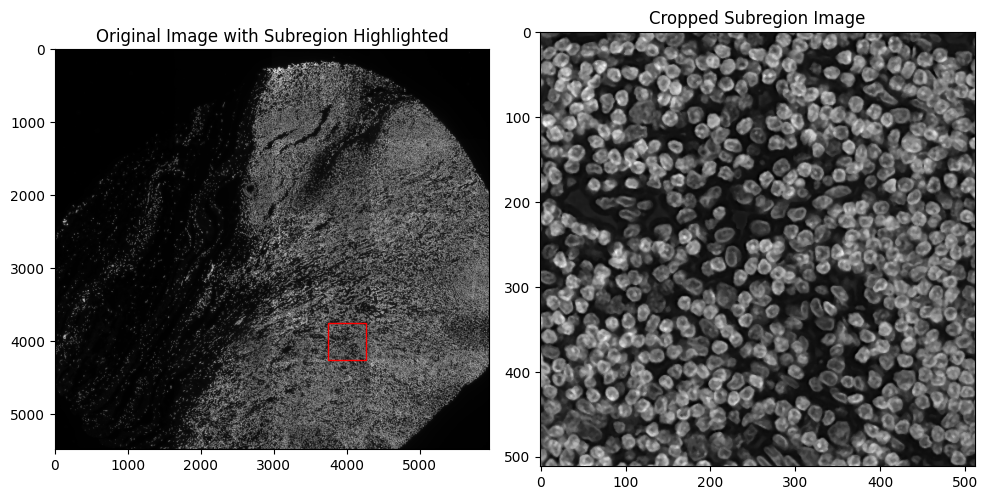

In [4]:
# paramters ^ #####
region = "reg001"
marker = "Ch1Cy1"
length = 512
x_mid, y_mid = 4000, 4000
# paramters $ #####

metadata_dict_sm = mo.metadata_dict_subset_region(metadata_dict, [region])
marker_object_sm = mo.organize_marker_object(metadata_dict_sm, marker_list=[marker])
im = marker_object_sm[region][marker]
vis.plot_cropped_subregion(
    im, x_mid=x_mid, y_mid=y_mid, length=length, figsize=(10, 10), cmap="gray"
)

# 02. Segmentation

In [5]:
# parameter ^ #####
boundary_broad = ["CD45", "NaKATP", "ATP5A", "HLA1", "C1Q", "GLUT1", "VDAC1"]
boundary_restricted = [
    "CD16",
    "CD68",
    "CD163",
    "CD31",
    "DIG_TREM2",
    "CD8",
    "CA9_500ms",
    "Cytokeratin",
]
internal_nuclear = ["Ch1Cy1"]
internal_cytoplasmic = ["aSMA"]
# parameter $ #####

marker_list = (
    boundary_broad + boundary_restricted + internal_nuclear + internal_cytoplasmic
)
# create marker_object
metadata_dict = metadata_dict_sm
marker_object = mo.organize_marker_object(metadata_dict, marker_list=marker_list)
marker_object = mo.marker_object_crop_subregion(
    marker_object, x_mid=x_mid, y_mid=y_mid, length=length
)

100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


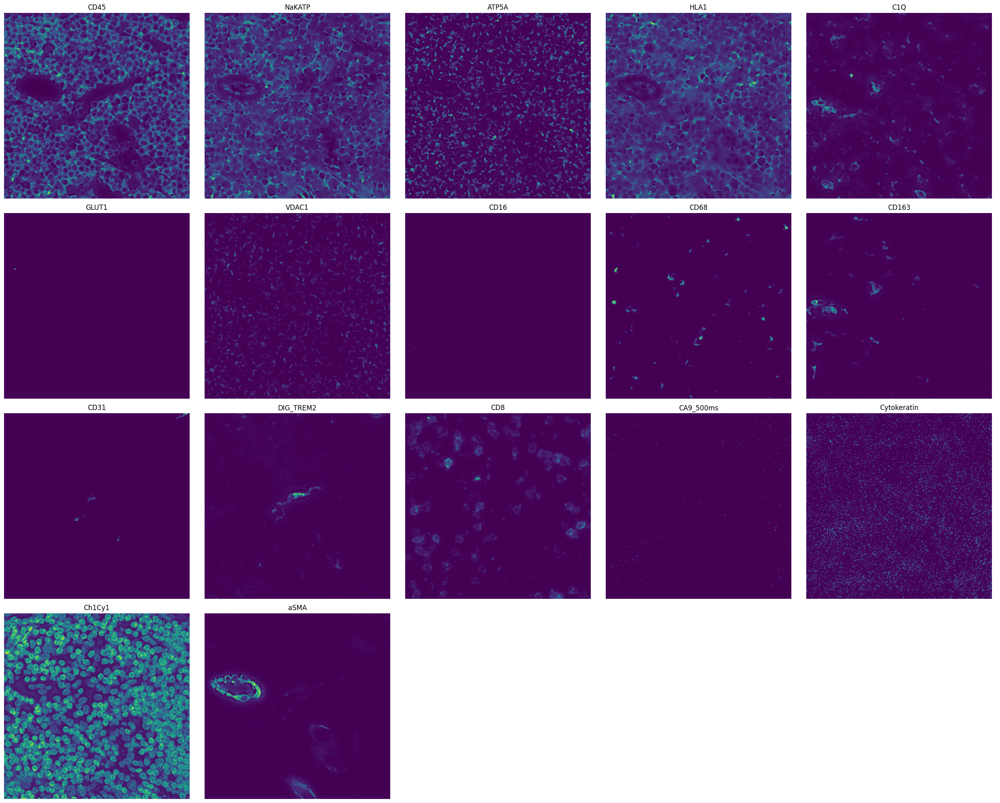

In [6]:
marker_dict = marker_object[region]
vis.plot_scale_marker_sum(
    [[marker] for marker in marker_list],
    marker_list,
    marker_dict,
    scale=True,
    ncol=5,
    vmax = 255, 
    figsize=(5, 5),
)

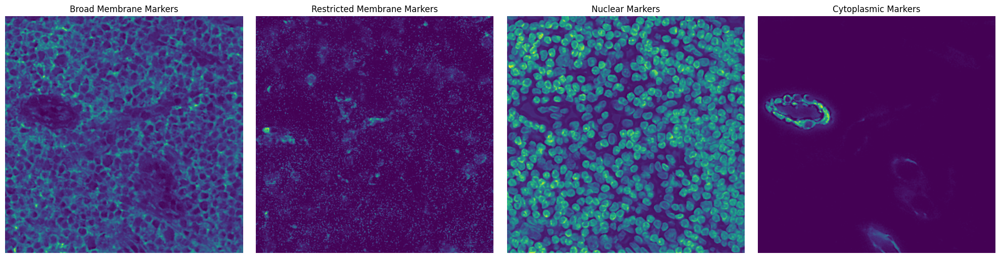

In [7]:
marker_dict = marker_object[region]
marker_lists = [
    boundary_broad,
    boundary_restricted,
    internal_nuclear,
    internal_cytoplasmic,
]
title_list = [
    "Broad Membrane Markers",
    "Restricted Membrane Markers",
    "Nuclear Markers",
    "Cytoplasmic Markers",
]
# title_list = [", ".join(marker_list) for marker_list in marker_lists]

vis.plot_scale_marker_sum(
    marker_lists,
    title_list,
    marker_dict,
    scale=True,
    ncol=4,
    figsize=(5, 5),
)


In [8]:
# parameter ^ #####
boundary_markers = boundary_broad
internal_markers = internal_nuclear + internal_cytoplasmic
pixel_size_um = 377.5202 / 1000
# pixel_size_um = 352.7778 / 1000
scale = True
maxima_threshold = 0.075
interior_threshold = 0.20
# parameter $ #####

mask_object = mo.marker_object_segmentation_mesmer(
    marker_object,
    boundary_markers,
    internal_markers,
    pixel_size_um,
    scale,
    maxima_threshold,
    interior_threshold,
)

  0%|          | 0/1 [00:00<?, ?it/s]2024-10-20 00:34:04.013529: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-20 00:34:04.431756: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13883 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:b1:00.0, compute capability: 8.6


2024-10-20 00:34:12.967071: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100
2024-10-20 00:34:13.596626: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
100%|██████████| 1/1 [00:11<00:00, 12.00s/it]


boundary: ['CD45', 'NaKATP', 'ATP5A', 'HLA1', 'C1Q', 'GLUT1', 'VDAC1']
internal: ['Ch1Cy1', 'aSMA']


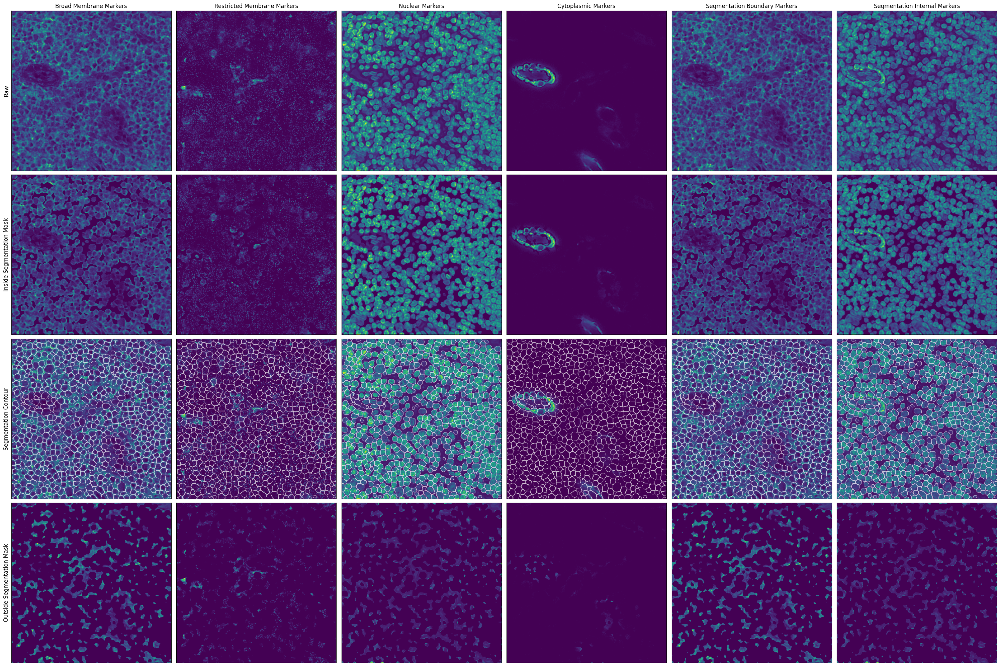

In [10]:
mask_dict = mask_object[region]

print(f"boundary: {boundary_markers}")
print(f"internal: {internal_markers}")

vis.plot_scale_marker_sum_segmentation(
    [
        boundary_broad,
        boundary_restricted,
        internal_nuclear,
        internal_cytoplasmic,
        boundary_markers,
        internal_markers,
    ],
    [
        "Broad Membrane Markers",
        "Restricted Membrane Markers",
        "Nuclear Markers",
        "Cytoplasmic Markers",
        "Segmentation Boundary Markers",
        "Segmentation Internal Markers",
    ],
    marker_dict,
    mask_dict,
    scale=True,
    alpha=0.75,
    figsize=(5, 5),
)